In [1]:
import warnings
warnings.simplefilter('ignore')

In [2]:
import os

In [3]:
import numpy as np

In [4]:
import pandas as pd

In [5]:
import plotly.express as px

In [6]:
import plotly.graph_objects as go

In [7]:
import plotly.figure_factory as ff

In [8]:
from plotly.subplots import make_subplots

In [9]:
import matplotlib.pyplot as plt

In [10]:
import seaborn as sns

In [11]:
import datetime

In [12]:
import re

In [13]:
import folium

In [14]:
from colorama import Fore

In [15]:
from sklearn.preprocessing import StandardScaler

In [16]:
from sklearn.model_selection import train_test_split

In [17]:
from sklearn.ensemble import RandomForestRegressor

In [18]:
from sklearn.ensemble import GradientBoostingRegressor

In [19]:
from sklearn.linear_model import LinearRegression

In [20]:
from sklearn.neighbors import KNeighborsRegressor

In [21]:
from sklearn.tree import DecisionTreeRegressor

In [22]:
from sklearn.multioutput import MultiOutputRegressor

In [23]:
from sklearn.model_selection import GridSearchCV

In [24]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

In [25]:
from sklearn.metrics import mean_squared_error

In [26]:
from sklearn.metrics import r2_score

In [27]:
primary_blue = "#496595"
primary_blue2 = "#85a1c1"
primary_blue3 = "#3f4d63"
primary_grey = "#c6ccd8"
primary_black = "#202022"
primary_bgcolor = "#f4f0ea"

primary_green = px.colors.qualitative.Plotly[2]

In [28]:
train_df = pd.read_csv("Downloads/train.csv")

In [29]:
train_df.head()

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
0,1372636858620000589,C,NaN,NaN,20000589,1372636858,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[..."
1,1372637303620000596,B,NaN,7.0,20000596,1372637303,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[..."
2,1372636951620000320,C,NaN,NaN,20000320,1372636951,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-..."
3,1372636854620000520,C,NaN,NaN,20000520,1372636854,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[..."
4,1372637091620000337,C,NaN,NaN,20000337,1372637091,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-..."


In [30]:
train_df.sample(10)

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE
1417653,1399256447620000548,C,NaN,NaN,20000548,1399256447,A,False,"[[-8.615682,41.147289],[-8.616384,41.147163],[..."
940139,1390183287620000280,C,NaN,NaN,20000280,1390183287,A,False,"[[-8.63811,41.159583],[-8.638083,41.159565],[-..."
1298744,1397068713620000295,B,NaN,55.0,20000295,1397068713,A,False,"[[-8.569881,41.166108],[-8.569494,41.166225],[..."
1420016,1399286876620000359,C,NaN,NaN,20000359,1399286876,A,False,"[[-8.631873,41.15259],[-8.630847,41.152527],[-..."
745153,1386457001620000310,C,NaN,NaN,20000310,1386457001,A,False,"[[-8.585685,41.148594],[-8.585775,41.148684],[..."
1237399,1395939062620000215,A,24199.0,NaN,20000215,1395939062,A,False,"[[-8.64738,41.151753],[-8.647371,41.15178],[-8..."
788907,1387286450620000172,A,27241.0,NaN,20000172,1387286450,A,False,"[[-8.680167,41.160798],[-8.679465,41.160636],[..."
1253437,1396206753620000456,B,NaN,53.0,20000456,1396206753,A,False,"[[-8.613891,41.141205],[-8.614044,41.141142],[..."
1063969,1392633122620000602,C,NaN,NaN,20000602,1392633122,A,False,"[[-8.601921,41.179563],[-8.601957,41.179554],[..."
227299,1377021927620000648,B,NaN,15.0,20000648,1377021927,A,False,"[[-8.585721,41.148441],[-8.585721,41.148621],[..."


In [31]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1710670 entries, 0 to 1710669
Data columns (total 9 columns):
 #   Column        Dtype  
---  ------        -----  
 0   TRIP_ID       int64  
 1   CALL_TYPE     object 
 2   ORIGIN_CALL   float64
 3   ORIGIN_STAND  float64
 4   TAXI_ID       int64  
 5   TIMESTAMP     int64  
 6   DAY_TYPE      object 
 7   MISSING_DATA  bool   
 8   POLYLINE      object 
dtypes: bool(1), float64(2), int64(3), object(3)
memory usage: 106.0+ MB


In [32]:
train_df.shape

(1710670, 9)

In [33]:
train_df.isnull().sum()

TRIP_ID               0
CALL_TYPE             0
ORIGIN_CALL     1345900
ORIGIN_STAND     904091
TAXI_ID               0
TIMESTAMP             0
DAY_TYPE              0
MISSING_DATA          0
POLYLINE              0
dtype: int64

In [34]:
train_df.duplicated().sum()

3

In [35]:
train_df.shape

(1710670, 9)

In [36]:
for i in range(train_df.shape[1]):
    print('-'*100)
    print(train_df.columns[i])
    print(train_df.iloc[:,i].value_counts())

----------------------------------------------------------------------------------------------------
TRIP_ID
1397172149620000454    3
1387206043620000080    2
1401840748620000196    2
1389002485620000685    2
1393462842620000620    2
                      ..
1385037152620000633    1
1393098473620000680    1
1389546998620000429    1
1389635371620000118    1
1397842436620000126    1
Name: TRIP_ID, Length: 1710589, dtype: int64
----------------------------------------------------------------------------------------------------
CALL_TYPE
B    817881
C    528019
A    364770
Name: CALL_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------
ORIGIN_CALL
2002.0     57571
63882.0     6406
2001.0      2499
13168.0     1314
6728.0      1115
           ...  
32201.0        1
42610.0        1
54879.0        1
14773.0        1
39154.0        1
Name: ORIGIN_CALL, Length: 57105, dtype: int64
-----------------------------------------------

In [37]:
vc = train_df["CALL_TYPE"].value_counts()

In [38]:
px.bar(vc, x=vc.index, y=vc.values, color=vc.index)

In [39]:
train_df["TIMESTAMP"] = [float(time) for time in train_df["TIMESTAMP"]]
train_df["dt"] = [datetime.datetime.fromtimestamp(time, datetime.timezone.utc) for time in train_df["TIMESTAMP"]]

In [40]:
train_df["year"] = train_df["dt"].dt.year
train_df["month"] = train_df["dt"].dt.month
train_df["day"] = train_df["dt"].dt.day
train_df["hour"] = train_df["dt"].dt.hour
train_df["min"] = train_df["dt"].dt.minute
train_df["weekday"] = train_df["dt"].dt.weekday

In [41]:
train_df.head()

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,dt,year,month,day,hour,min,weekday
0,1372636858620000589,C,NaN,NaN,20000589,1.372637e+09,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,2013,7,1,0,0,0
1,1372637303620000596,B,NaN,7.0,20000596,1.372637e+09,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,2013,7,1,0,8,0
2,1372636951620000320,C,NaN,NaN,20000320,1.372637e+09,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,2013,7,1,0,2,0
3,1372636854620000520,C,NaN,NaN,20000520,1.372637e+09,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,2013,7,1,0,0,0
4,1372637091620000337,C,NaN,NaN,20000337,1.372637e+09,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,2013,7,1,0,4,0


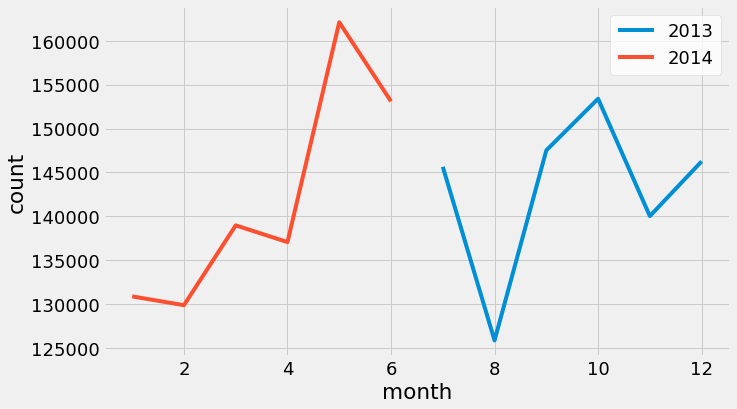

In [42]:
pivot = pd.pivot_table(train_df, index='month', columns="year", values="TRIP_ID", aggfunc="count").reset_index()
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["month"], pivot[2013], label="2013")
    plt.plot(pivot["month"], pivot[2014], label="2014")
    plt.xlabel("month")
    plt.ylabel("count")
    plt.legend(facecolor="white")

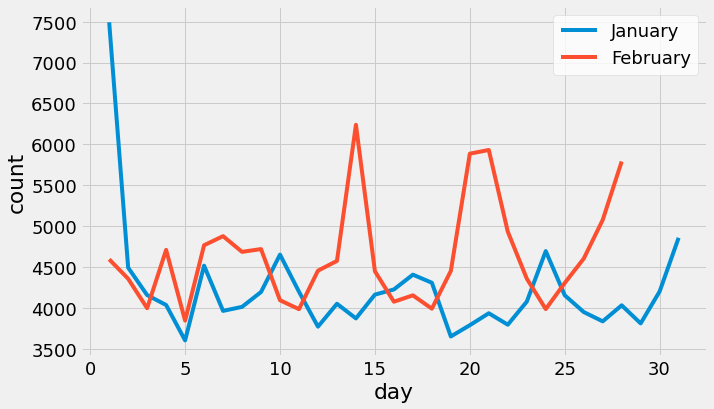

In [43]:
pivot = pd.pivot_table(train_df, index='day', columns="month", values="TRIP_ID", aggfunc="count").reset_index()
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["day"], pivot[1], label="January")
    plt.plot(pivot["day"], pivot[2], label="February")
    plt.xlabel("day")
    plt.ylabel("count")
    plt.legend(facecolor="white")

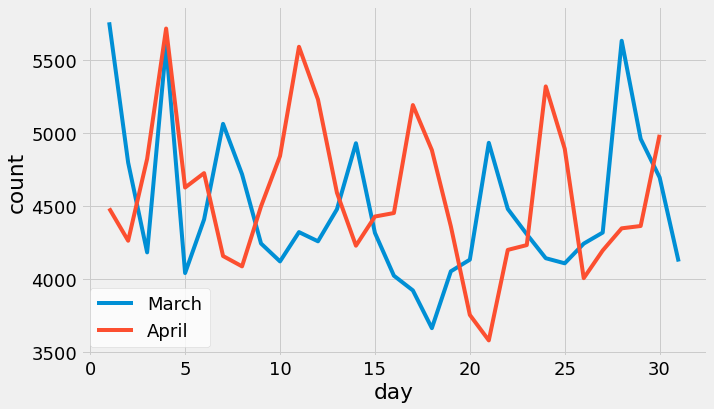

In [44]:
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["day"], pivot[3], label="March")
    plt.plot(pivot["day"], pivot[4], label="April")
    plt.xlabel("day")
    plt.ylabel("count")
    plt.legend(facecolor="white")

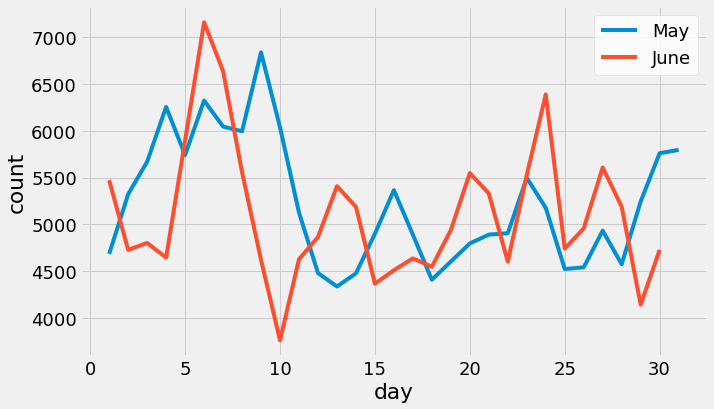

In [45]:
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["day"], pivot[5], label="May")
    plt.plot(pivot["day"], pivot[6], label="June")
    plt.xlabel("day")
    plt.ylabel("count")
    plt.legend(facecolor="white")

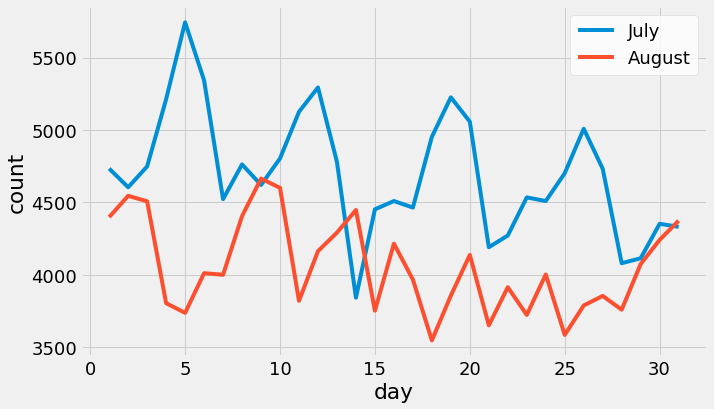

In [46]:
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["day"], pivot[7], label="July")
    plt.plot(pivot["day"], pivot[8], label="August")
    plt.xlabel("day")
    plt.ylabel("count")
    plt.legend(facecolor="white")

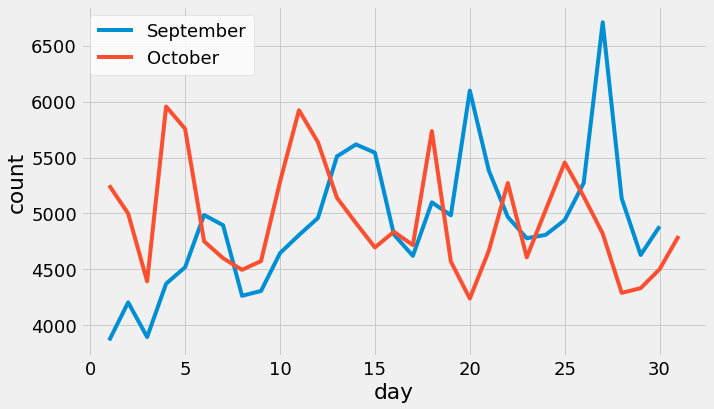

In [47]:
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["day"], pivot[9], label="September")
    plt.plot(pivot["day"], pivot[10], label="October")
    plt.xlabel("day")
    plt.ylabel("count")
    plt.legend(facecolor="white")

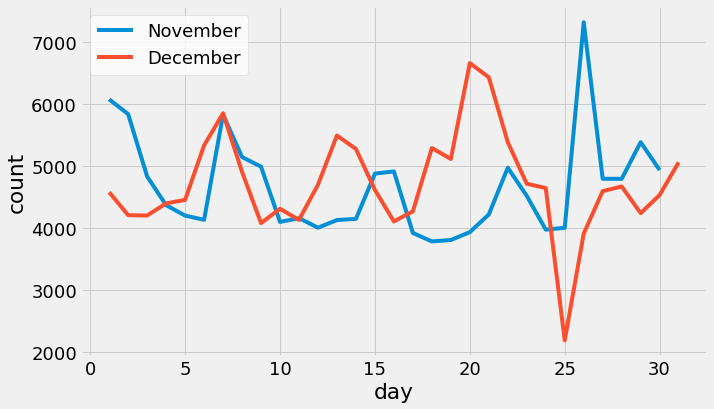

In [48]:
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["day"], pivot[11], label="November")
    plt.plot(pivot["day"], pivot[12], label="December")
    plt.xlabel("day")
    plt.ylabel("count")
    plt.legend(facecolor="white")

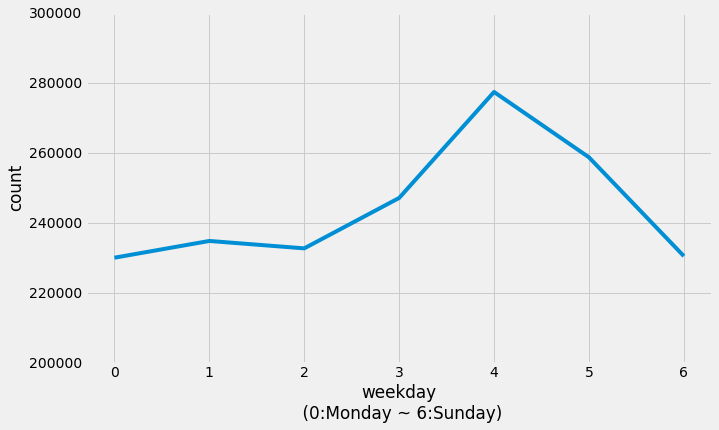

In [49]:
weekday = pd.DataFrame(data=train_df.groupby("weekday").TRIP_ID.count()).reset_index()

with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    
    plt.plot(weekday["weekday"], weekday["TRIP_ID"])
    plt.xlabel("weekday\n (0:Monday ~ 6:Sunday)")
    plt.ylabel("count")
    plt.ylim([200000, 300000])

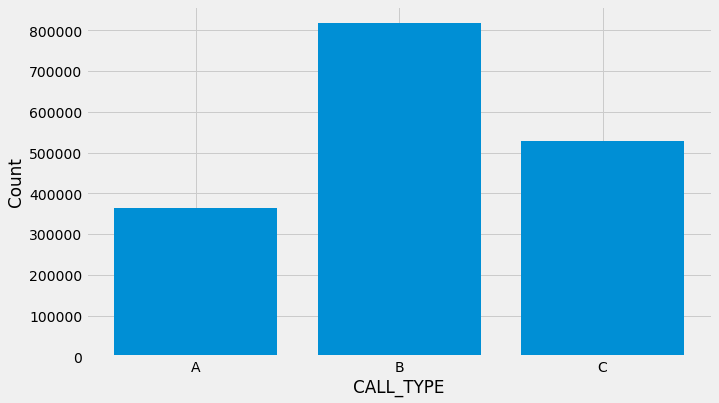

In [50]:
call_type = pd.DataFrame(data=train_df.groupby("CALL_TYPE").TRIP_ID.count()).reset_index()
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.bar(call_type["CALL_TYPE"], call_type["TRIP_ID"])
    plt.xlabel("CALL_TYPE")
    plt.ylabel("Count")

In [51]:
lists_1st_lon = []
for i in range(0,len(train_df["POLYLINE"])):
    if train_df["POLYLINE"][i] == '[]':
        k=0
        lists_1st_lon.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_df["POLYLINE"][i]).split(",")[0]
        lists_1st_lon.append(k)
        
train_df["lon_1st"] = lists_1st_lon

In [52]:
lists_1st_lat = []
for i in range(0,len(train_df["POLYLINE"])):
    if train_df["POLYLINE"][i] == '[]':
        k=0
        lists_1st_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_df["POLYLINE"][i]).split(",")[1]
        lists_1st_lat.append(k)
        
train_df["lat_1st"] = lists_1st_lat

In [53]:
train_df

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,dt,year,month,day,hour,min,weekday,lon_1st,lat_1st
0,1372636858620000589,C,NaN,NaN,20000589,1.372637e+09,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,2013,7,1,0,0,0,-8.618643,41.141412
1,1372637303620000596,B,NaN,7.0,20000596,1.372637e+09,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,2013,7,1,0,8,0,-8.639847,41.159826
2,1372636951620000320,C,NaN,NaN,20000320,1.372637e+09,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,2013,7,1,0,2,0,-8.612964,41.140359
3,1372636854620000520,C,NaN,NaN,20000520,1.372637e+09,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,2013,7,1,0,0,0,-8.574678,41.151951
4,1372637091620000337,C,NaN,NaN,20000337,1.372637e+09,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,2013,7,1,0,4,0,-8.645994,41.18049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1710665,1404171463620000698,C,NaN,NaN,20000698,1.404171e+09,A,False,"[[-8.612469,41.14602],[-8.612487,41.145993],[-...",2014-06-30 23:37:43+00:00,2014,6,30,23,37,0,-8.612469,41.14602
1710666,1404171367620000670,C,NaN,NaN,20000670,1.404171e+09,A,False,"[[-8.610138,41.140845],[-8.610174,41.140935],[...",2014-06-30 23:36:07+00:00,2014,6,30,23,36,0,-8.610138,41.140845
1710667,1388745716620000264,C,NaN,NaN,20000264,1.388746e+09,A,False,[],2014-01-03 10:41:56+00:00,2014,1,3,10,41,4,0,0
1710668,1404141826620000248,B,NaN,12.0,20000248,1.404142e+09,A,False,"[[-8.630712,41.154885],[-8.63073,41.154813],[-...",2014-06-30 15:23:46+00:00,2014,6,30,15,23,0,-8.630712,41.154885


In [54]:
lists_last_lon = []
for i in range(0,len(train_df["POLYLINE"])):
        if train_df["POLYLINE"][i] == '[]':
            k=0
            lists_last_lon.append(k)
        else:
            k = re.sub(r"[[|[|]|]|]]", "", train_df["POLYLINE"][i]).split(",")[-2]
            lists_last_lon.append(k)

train_df["lon_last"] = lists_last_lon

In [55]:
lists_last_lat = []
for i in range(0,len(train_df["POLYLINE"])):
    if train_df["POLYLINE"][i] == '[]':
        k=0
        lists_last_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_df["POLYLINE"][i]).split(",")[-1]
        lists_last_lat.append(k)
        
train_df["lat_last"] = lists_last_lat

In [56]:
train_df

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,dt,year,month,day,hour,min,weekday,lon_1st,lat_1st,lon_last,lat_last
0,1372636858620000589,C,NaN,NaN,20000589,1.372637e+09,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,2013,7,1,0,0,0,-8.618643,41.141412,-8.630838,41.154489
1,1372637303620000596,B,NaN,7.0,20000596,1.372637e+09,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,2013,7,1,0,8,0,-8.639847,41.159826,-8.66574,41.170671
2,1372636951620000320,C,NaN,NaN,20000320,1.372637e+09,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,2013,7,1,0,2,0,-8.612964,41.140359,-8.61597,41.14053
3,1372636854620000520,C,NaN,NaN,20000520,1.372637e+09,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,2013,7,1,0,0,0,-8.574678,41.151951,-8.607996,41.142915
4,1372637091620000337,C,NaN,NaN,20000337,1.372637e+09,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,2013,7,1,0,4,0,-8.645994,41.18049,-8.687268,41.178087
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1710665,1404171463620000698,C,NaN,NaN,20000698,1.404171e+09,A,False,"[[-8.612469,41.14602],[-8.612487,41.145993],[-...",2014-06-30 23:37:43+00:00,2014,6,30,23,37,0,-8.612469,41.14602,-8.611344,41.171013
1710666,1404171367620000670,C,NaN,NaN,20000670,1.404171e+09,A,False,"[[-8.610138,41.140845],[-8.610174,41.140935],[...",2014-06-30 23:36:07+00:00,2014,6,30,23,36,0,-8.610138,41.140845,-8.627454,41.158755
1710667,1388745716620000264,C,NaN,NaN,20000264,1.388746e+09,A,False,[],2014-01-03 10:41:56+00:00,2014,1,3,10,41,4,0,0,0,0
1710668,1404141826620000248,B,NaN,12.0,20000248,1.404142e+09,A,False,"[[-8.630712,41.154885],[-8.63073,41.154813],[-...",2014-06-30 15:23:46+00:00,2014,6,30,15,23,0,-8.630712,41.154885,-8.587026,41.173524


In [56]:
train_df = train_df.query("lon_last != 0")

In [57]:
train_df["lon_1st"] = [float(k) for k in train_df["lon_1st"]]
train_df["lat_1st"] = [float(k) for k in train_df["lat_1st"]]
train_df["lon_last"] = [float(k) for k in train_df["lon_last"]]
train_df["lat_last"] = [float(k) for k in train_df["lat_last"]]

In [58]:
mapping_1st = pd.DataFrame({
    "date":train_df.head(5000)["dt"].values,
    "lat":train_df.head(5000)["lat_1st"].values,
    "lon":train_df.head(5000)["lon_1st"].values
})

In [59]:
mapping_last = pd.DataFrame({
    "date":train_df.head(5000)["dt"].values,
    "lat":train_df.head(5000)["lat_last"].values,
    "lon":train_df.head(5000)["lon_last"].values
})

In [60]:
por_map = folium.Map(location=[41.141412,-8.590324], tiles='Stamen Terrain', zoom_start=11)

for i, r in mapping_1st.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="red").add_to(por_map)

for i, r in mapping_last.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="blue").add_to(por_map)    
    
por_map

In [61]:
train_df["delta_lon"] = train_df["lon_last"] - train_df["lon_1st"]
train_df["delta_lat"] = train_df["lat_last"] - train_df["lat_1st"]

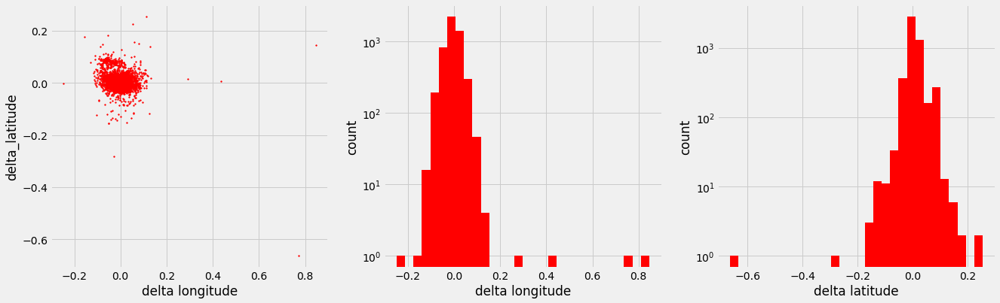

In [62]:
sample = train_df.head(5000)

with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots(1,3,figsize=(20, 6))
    ax[0].scatter(sample["delta_lon"], sample["delta_lat"], s=3, c="red")
    ax[0].set_xlabel("delta longitude")
    ax[0].set_ylabel("delta_latitude")
    ax[1].hist(sample["delta_lon"], bins=30, color="red")
    ax[1].set_xlabel("delta longitude")
    ax[1].set_ylabel("count")
    ax[1].set_yscale("log")
    ax[2].hist(sample["delta_lat"], bins=30, color="red")
    ax[2].set_xlabel("delta latitude")
    ax[2].set_ylabel("count")
    ax[2].set_yscale("log")

In [63]:
train_df["month_str"] = [str(i) for i in train_df["month"]]

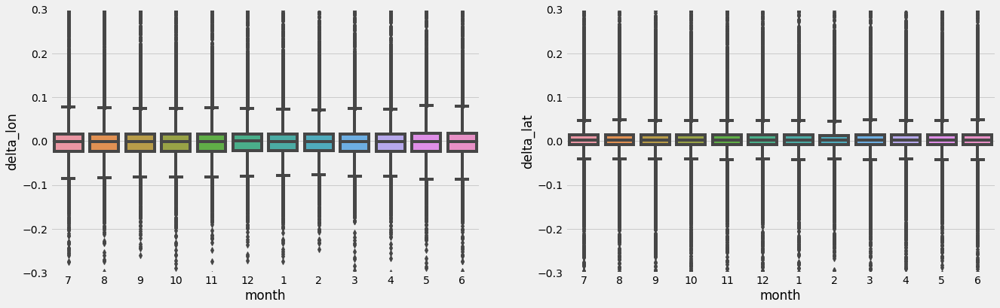

In [64]:
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots(1,2, figsize=(20,6))
    sns.boxplot("month_str", "delta_lon", data=train_df, ax=ax[0])
    ax[0].set_xlabel("month")
    ax[0].set_ylabel("delta_lon")
    ax[0].set_ylim([-0.3,0.3])
    sns.boxplot("month_str", "delta_lat", data=train_df, ax=ax[1])
    ax[1].set_xlabel("month")
    ax[1].set_ylabel("delta_lat")
    ax[1].set_ylim([-0.3,0.3])

In [65]:
train_df["weekday_str"] = [str(i) for i in train_df["weekday"]]

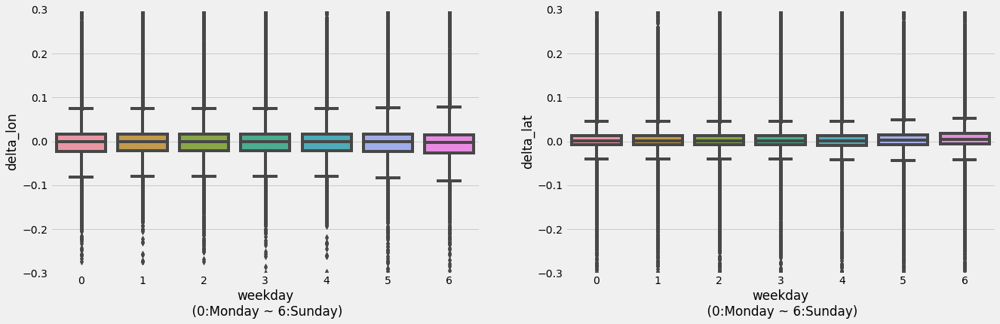

In [66]:
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots(1,2, figsize=(20,6))
    sns.boxplot("weekday_str", "delta_lon", data=train_df, ax=ax[0])
    ax[0].set_xlabel("weekday\n (0:Monday ~ 6:Sunday)")
    ax[0].set_ylabel("delta_lon")
    ax[0].set_ylim([-0.3,0.3])
    sns.boxplot("weekday_str", "delta_lat", data=train_df, ax=ax[1])
    ax[1].set_xlabel("weekday\n (0:Monday ~ 6:Sunday)")
    ax[1].set_ylabel("delta_lat")
    ax[1].set_ylim([-0.3,0.3])

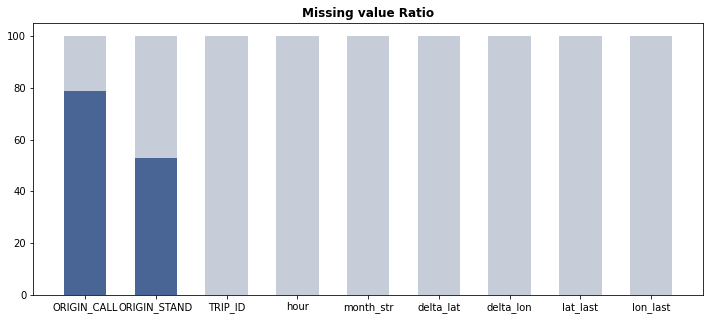

In [67]:
nan_data = (train_df.isna().sum().sort_values(ascending=False) / len(train_df) * 100)[:9]
fig, ax = plt.subplots(1,1,figsize=(12, 5))

ax.bar(nan_data.index, 100, color=primary_grey, width=0.6)

bar = ax.bar(
    nan_data.index, 
    nan_data, 
    color=primary_blue, 
    width=0.6
)

ax.set_title('Missing value Ratio', fontweight='bold')

plt.show()

In [68]:
df_ml = train_df.copy()

In [69]:
df_ml = df_ml.query("delta_lon <= 0.2 & delta_lon >= -0.2 & delta_lat <= 0.2 & delta_lat >= -0.2")

In [70]:
map_call = {"A":1, "B":2, "C":3}
df_ml["Call_type"] = df_ml["CALL_TYPE"].map(map_call)

In [71]:
def origin_call_flg(x):
    if x["ORIGIN_CALL"] == None:
        res = 0
    else:
        res = 1
    return res
df_ml["ORIGIN_CALL"] = df_ml.apply(origin_call_flg, axis=1)

In [72]:
def origin_stand_flg(x):
    if x["ORIGIN_STAND"] == None:
        res = 0
    else:
        res=1
    return res
df_ml["ORIGIN_STAND"] = df_ml.apply(origin_stand_flg, axis=1)

In [73]:
df_ml.drop("DAY_TYPE", axis=1, inplace=True)

In [74]:
def miss_flg(x):
    if x["MISSING_DATA"] == "False":
        res = 0
    else:
        res = 1
    return res
df_ml["MISSING_DATA"] = df_ml.apply(miss_flg, axis=1)

In [75]:
df_ml = df_ml.sample(50000)

In [76]:
X = df_ml[["Call_type", 'ORIGIN_CALL', 'ORIGIN_STAND', 'MISSING_DATA', 'lon_1st', 'lat_1st', 'delta_lon', 'delta_lat']]

In [77]:
y = df_ml[["lon_last","lat_last"]]

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [79]:
forest = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=1))

In [80]:
forest = forest.fit(X_train, y_train)

In [81]:
y_train_pred = forest.predict(X_train)
y_test_pred = forest.predict(X_test)

In [82]:
print("MSE train:{}".format(mean_squared_error(y_train, y_train_pred)))
print("MSE test;{}".format(mean_squared_error(y_test, y_test_pred)))

MSE train:2.4980187378867703e-05
MSE test;0.004650034259895064


In [83]:
print("R2 score train:{}".format(r2_score(y_train, y_train_pred)))
print("R2 score test:{}".format(r2_score(y_test, y_test_pred)))

R2 score train:0.9817102367252066
R2 score test:0.12630186460609205


In [84]:
bosting = MultiOutputRegressor(GradientBoostingRegressor(random_state=0))

In [85]:
bosting = bosting.fit(X_train, y_train)

In [86]:
y_train_pred2 = bosting.predict(X_train)
y_test_pred2 = bosting.predict(X_test)

In [87]:
print("Mean Square Error on training Data:{}".format(mean_squared_error(y_train, y_train_pred2)))
print("Mean Square Error on testing Data:{}".format(mean_squared_error(y_test, y_test_pred2)))

Mean Square Error on training Data:2.4198733896762544e-06
Mean Square Error on testing Data:0.004411038768101642


In [88]:
print("R2 score train:{}".format(r2_score(y_train, y_train_pred2)))
print("R2 score test:{}".format(r2_score(y_test, y_test_pred2)))

R2 score train:0.9974964878884519
R2 score test:0.17051239812332536


In [89]:
lr = MultiOutputRegressor(LinearRegression(n_jobs=1))

In [90]:
lr = lr.fit(X_train, y_train)

In [91]:
y_train_pred4 = lr.predict(X_train)
y_test_pred4 = lr.predict(X_test)

In [92]:
print("Mean Square Error on training Data:{}".format(mean_squared_error(y_train, y_train_pred4)))
print("Mean Square Error on testing Data:{}".format(mean_squared_error(y_test, y_test_pred4)))

Mean Square Error on training Data:2.524459702513217e-29
Mean Square Error on testing Data:2.5255329289923677e-29


In [93]:
print("R2 score train:{}".format(r2_score(y_train, y_train_pred4)))
print("R2 score test:{}".format(r2_score(y_test, y_test_pred4)))

R2 score train:1.0
R2 score test:1.0


In [94]:
knn = MultiOutputRegressor(KNeighborsRegressor())

In [95]:
knn = knn.fit(X_train, y_train)

In [96]:
y_train_pred5 = knn.predict(X_train)
y_test_pred5 = knn.predict(X_test)


In [97]:
print("Mean Square Error on training Data:{}".format(mean_squared_error(y_train, y_train_pred5)))
print("Mean Square Error on testing Data:{}".format(mean_squared_error(y_test, y_test_pred5)))

Mean Square Error on training Data:0.00010850054857096629
Mean Square Error on testing Data:0.00404297927346488


In [98]:
print("R2 score train:{}".format(r2_score(y_train, y_train_pred5)))
print("R2 score test:{}".format(r2_score(y_test, y_test_pred5)))

R2 score train:0.9147191817733027
R2 score test:0.19369829615167516


In [99]:
dt = MultiOutputRegressor(DecisionTreeRegressor(max_depth=50, random_state=1))

In [100]:
dt = dt.fit(X_train, y_train)

In [101]:
y_train_pred6 = dt.predict(X_train)
y_test_pred6 = dt.predict(X_test)

In [102]:
print("Mean Square Error on training Data:{}".format(mean_squared_error(y_train, y_train_pred6)))
print("Mean Square Error on testing Data:{}".format(mean_squared_error(y_test, y_test_pred6)))

Mean Square Error on training Data:0.0
Mean Square Error on testing Data:0.006469514027247597


In [103]:
print("R2 score train:{}".format(r2_score(y_train, y_train_pred6)))
print("R2 score test:{}".format(r2_score(y_test, y_test_pred6)))

R2 score train:1.0
R2 score test:-0.1331364364596656
